In [2]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

C:\Users\amit.prakash\AppData\Local\Continuum\anaconda3\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


## 1.1 Reading Data

In [3]:
project_data = pd.read_csv('train_data.csv', nrows=10000)
resource_data = pd.read_csv('resources.csv')
project_data = project_data[pd.notnull(project_data['teacher_prefix'])]


In [4]:
project_data.isnull().sum()

Unnamed: 0                                         0
id                                                 0
teacher_id                                         0
teacher_prefix                                     0
school_state                                       0
project_submitted_datetime                         0
project_grade_category                             0
project_subject_categories                         0
project_subject_subcategories                      0
project_title                                      0
project_essay_1                                    0
project_essay_2                                    0
project_essay_3                                 9688
project_essay_4                                 9688
project_resource_summary                           0
teacher_number_of_previously_posted_projects       0
project_is_approved                                0
dtype: int64

In [5]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (9999, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [6]:
y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)
project_data.head(1)



,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0


## 1.3 preprocessing of `project_subject_categories`


In [7]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [8]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,History_Civics Health_Sports


## 1.3 preprocessing of `project_subject_subcategories`

In [9]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [10]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,History_Civics Health_Sports,Civics_Government TeamSports


In [11]:
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace(' ', '_')
project_data['project_grade_category'] = project_data['project_grade_category'].str.replace('-', '_')
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6_8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,History_Civics Health_Sports,Civics_Government TeamSports


## 1.4 Merging datasets

In [12]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(5)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21
2,p000003,298.97,4
3,p000004,1113.69,98
4,p000005,485.99,8


In [13]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [14]:
project_data.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy,154.6,23


## 1.3 Text preprocessing

In [15]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [16]:
# we get the cost of the project using resource.csv file
resource_data.head(5)

,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95
2,p069063,Cory Stories: A Kid's Book About Living With Adhd,1,8.45
3,p069063,"Dixon Ticonderoga Wood-Cased #2 HB Pencils, Bo...",2,13.59
4,p069063,EDUCATIONAL INSIGHTS FLUORESCENT LIGHT FILTERS...,3,24.95


In [17]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [19]:
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:21<00:00, 465.15it/s]


In [20]:
project_data["essay"] = preprocessed_essays

project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,price,quantity,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy,154.6,23,my students english learners working english s...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6_8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,History_Civics Health_Sports,Civics_Government TeamSports,299.0,1,our students arrive school eager learn they po...


In [21]:
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    title = decontracted(sentance)
    title = title.replace('\\r', ' ')
    title = title.replace('\\"', ' ')
    title = title.replace('\\n', ' ')
    title = re.sub('[^A-Za-z0-9]+', ' ', title)
    # https://gist.github.com/sebleier/554280
    title = ' '.join(e for e in title.split() if e not in stopwords)
    preprocessed_titles.append(title.lower().strip())

100%|████████████████████████████████████████████████████████████████████████████| 9999/9999 [00:01<00:00, 8918.66it/s]


In [22]:
project_data["project_title"] = preprocessed_titles

project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,price,quantity,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,educational support english learners home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy,154.6,23,my students english learners working english s...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6_8,wanted projector hungry learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,History_Civics Health_Sports,Civics_Government TeamSports,299.0,1,our students arrive school eager learn they po...


In [23]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for essay in project_data:
    essay.lower()
    ss = sid.polarity_scores(essay)

    for k in ss:
        project_data['compound_rate'] = ss['compound']
        project_data['pos_rate']= ss['pos']
        project_data['neu_rate']= ss['neu']
        project_data['neg_rate']= ss['neg']
                
print(project_data['compound_rate'].shape)
project_data.head(2)

(9999,)


[nltk_data] Error loading vader_lexicon: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,price,quantity,essay,compound_rate,pos_rate,neu_rate,neg_rate
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades_PreK_2,educational support english learners home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,0,Literacy_Language,ESL Literacy,154.6,23,my students english learners working english s...,0.0,0.0,1.0,0.0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades_6_8,wanted projector hungry learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,7,History_Civics Health_Sports,Civics_Government TeamSports,299.0,1,our students arrive school eager learn they po...,0.0,0.0,1.0,0.0


In [24]:
 project_data['essay_n_words'] = project_data['essay'].apply(lambda row: len(row.split(" ")))

## 1.5 Sorting according to date

In [25]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,clean_categories,clean_subcategories,price,quantity,essay,compound_rate,pos_rate,neu_rate,neg_rate,essay_n_words
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades_PreK_2,flexible seating flexible learning,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,AppliedLearning,EarlyDevelopment,481.04,9,i recently read article giving students choice...,0.0,0.0,1.0,0.0,127
7176,79341,p091436,bb2599c4a114d211b3381abe9f899bf8,Mrs.,OH,2016-04-27 07:24:47,Grades_PreK_2,robots taking 2nd grade,"Computer coding and robotics, my second grader...","We are a small, rural school in Northwest Ohio...",...,Math_Science AppliedLearning,AppliedSciences EarlyDevelopment,50.96,2,computer coding robotics second graders excite...,0.0,0.0,1.0,0.0,97


In [26]:
project_data["project_title"] = preprocessed_titles
project_data['title_n_words'] = project_data['project_title'].apply(lambda row: len(row.split(" ")))
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,...,clean_subcategories,price,quantity,essay,compound_rate,pos_rate,neu_rate,neg_rate,essay_n_words,title_n_words
473,100660,p234804,cbc0e38f522143b86d372f8b43d4cff3,Mrs.,GA,2016-04-27 00:53:00,Grades_PreK_2,educational support english learners home,I recently read an article about giving studen...,I teach at a low-income (Title 1) school. Ever...,...,EarlyDevelopment,481.04,9,i recently read article giving students choice...,0.0,0.0,1.0,0.0,127,5
7176,79341,p091436,bb2599c4a114d211b3381abe9f899bf8,Mrs.,OH,2016-04-27 07:24:47,Grades_PreK_2,wanted projector hungry learners,"Computer coding and robotics, my second grader...","We are a small, rural school in Northwest Ohio...",...,AppliedSciences EarlyDevelopment,50.96,2,computer coding robotics second graders excite...,0.0,0.0,1.0,0.0,97,4


In [27]:
X=project_data

## 1.6 Splitting data

In [28]:

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)
  

In [29]:
print(X.shape)
print(X_train.shape)
print(X_cv.shape)
print(X_test.shape)
print(y.shape)
print(y_train.shape)
print(y_cv.shape)
print(y_test.shape)


(9999, 25)
(4488, 25)
(2211, 25)
(3300, 25)
(9999,)
(4488,)
(2211,)
(3300,)


we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

In [30]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# <h1>2. Decision Trees </h1>

<h2>2.1 Make Data Model Ready: encoding numerical, categorical features</h2>

In [31]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
categories_ohe_train = vectorizer.fit_transform(X_train['clean_categories'].values)
categories_ohe_cv = vectorizer.transform(X_cv['clean_categories'].values)
categories_ohe_test = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(categories_ohe_train.shape, y_train.shape)
print(categories_ohe_cv.shape, y_cv.shape)
print(categories_ohe_test.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(4488, 9) (4488,)
(2211, 9) (2211,)
(3300, 9) (3300,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


In [32]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
subcategories_ohe_train = vectorizer.fit_transform(X_train['clean_subcategories'].values)
subcategories_ohe_cv = vectorizer.transform(X_cv['clean_subcategories'].values)
subcategories_ohe_test = vectorizer.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(subcategories_ohe_train.shape, y_train.shape)
print(subcategories_ohe_cv.shape, y_cv.shape)
print(subcategories_ohe_test.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(4488, 30) (4488,)
(2211, 30) (2211,)
(3300, 30) (3300,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


In [33]:
#vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values)
X_train_state_ohe = vectorizer.fit_transform(X_train['school_state'].values)
X_cv_state_ohe = vectorizer.transform(X_cv['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(4488, 51) (4488,)
(2211, 51) (2211,)
(3300, 51) (3300,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


In [34]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.fit_transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(4488, 4) (4488,)
(2211, 4) (2211,)
(3300, 4) (3300,)
['mr', 'mrs', 'ms', 'teacher']


In [35]:
X_train['project_grade_category'].head(20)

972     Grades_PreK_2
5233      Grades_9_12
2041    Grades_PreK_2
5387    Grades_PreK_2
3751    Grades_PreK_2
8035    Grades_PreK_2
4806       Grades_3_5
8600    Grades_PreK_2
4472       Grades_6_8
9885       Grades_3_5
1902       Grades_6_8
717       Grades_9_12
6060       Grades_3_5
6639      Grades_9_12
2030      Grades_9_12
8163    Grades_PreK_2
249       Grades_9_12
102        Grades_3_5
2463       Grades_6_8
1333    Grades_PreK_2
Name: project_grade_category, dtype: object

In [36]:
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vectorizer.get_feature_names())
print("="*100)

After vectorizations
(4488, 4) (4488,)
(2211, 4) (2211,)
(3300, 4) (3300,)
['grades_3_5', 'grades_6_8', 'grades_9_12', 'grades_prek_2']


<h2>2.2 Make Data Model Ready: encoding eassay, and project_title</h2>

In [37]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=50000)
vectorizer.fit(X_train['essay'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vectorizer.fit_transform(X_train['essay'].values)
X_cv_essay_bow = vectorizer.transform(X_cv['essay'].values)
X_test_essay_bow = vectorizer.transform(X_test['essay'].values)

                                        
print("After BOW vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_cv_essay_bow.shape, y_cv.shape)
print(X_test_essay_bow.shape, y_test.shape)
print("="*100)


(4488, 25) (4488,)
(2211, 25) (2211,)
(3300, 25) (3300,)
After BOW vectorizations
(4488, 13463) (4488,)
(2211, 13463) (2211,)
(3300, 13463) (3300,)


In [38]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=50000)
vectorizer.fit(X_train['project_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_title_bow = vectorizer.fit_transform(X_train['project_title'].values)
X_cv_title_bow = vectorizer.transform(X_cv['project_title'].values)
X_test_title_bow = vectorizer.transform(X_test['project_title'].values)

                                        
print("After vectorizations")
print(X_train_title_bow.shape, y_train.shape)
print(X_cv_title_bow.shape, y_cv.shape)
print(X_test_title_bow.shape, y_test.shape)
print("="*100)


(4488, 25) (4488,)
(2211, 25) (2211,)
(3300, 25) (3300,)
After vectorizations
(4488, 411) (4488,)
(2211, 411) (2211,)
(3300, 411) (3300,)


In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=50000)
vectorizer.fit(X_train['essay'].values) # fit has to happen only on train data

X_train_essay_tfidf = vectorizer.fit_transform(X_train['essay'].values)
X_cv_essay_tfidf = vectorizer.transform(X_cv['essay'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['essay'].values)

print("After TFIDF vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*100)

After TFIDF vectorizations
(4488, 13463) (4488,)
(2211, 13463) (2211,)
(3300, 13463) (3300,)


In [40]:
vectorizer = TfidfVectorizer(min_df=10, ngram_range=(1,4), max_features=50000)
vectorizer.fit(X_train['project_title'].values) # fit has to happen only on train data

X_train_title_tfidf = vectorizer.fit_transform(X_train['project_title'].values)
X_cv_title_tfidf = vectorizer.transform(X_cv['project_title'].values)
X_test_title_tfidf = vectorizer.transform(X_test['project_title'].values)

print("After TFIDF vectorizations")
print(X_train_title_tfidf.shape, y_train.shape)
print(X_cv_title_tfidf.shape, y_cv.shape)
print(X_test_title_tfidf.shape, y_test.shape)
print("="*100)

After TFIDF vectorizations
(4488, 411) (4488,)
(2211, 411) (2211,)
(3300, 411) (3300,)


In [41]:
# average Word2Vec
# compute average word2vec for each review.
def w2v(data) :
    avg_w2v_vectors= []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(data): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if word in glove_words:
                vector += model[word]
                cnt_words += 1
        if cnt_words != 0:
            vector /= cnt_words
        avg_w2v_vectors.append(vector)
    
    print(len(avg_w2v_vectors))
    print(len(avg_w2v_vectors[0]))

X_train_essay_avg_w2v = w2v(X_train['essay'])
X_cv_essay_avg_w2v = w2v(X_cv['essay'])
X_test_essay_avg_w2v = w2v(X_test['essay'])
X_train_title_avg_w2v = w2v(X_train['project_title'])
X_cv_title_avg_w2v = w2v(X_cv['project_title'])
X_test_title_avg_w2v = w2v(X_test['project_title'])


100%|█████████████████████████████████████████████████████████████████████████████| 4488/4488 [00:05<00:00, 865.49it/s]


4488
300


100%|█████████████████████████████████████████████████████████████████████████████| 2211/2211 [00:03<00:00, 703.67it/s]


2211
300


100%|█████████████████████████████████████████████████████████████████████████████| 3300/3300 [00:03<00:00, 859.24it/s]


3300
300


100%|████████████████████████████████████████████████████████████████████████████| 4488/4488 [00:00<00:00, 9212.88it/s]


4488
300


100%|███████████████████████████████████████████████████████████████████████████| 2211/2211 [00:00<00:00, 11518.91it/s]


2211
300


100%|███████████████████████████████████████████████████████████████████████████| 3300/3300 [00:00<00:00, 11789.13it/s]


3300
300


In [42]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X_train['essay'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [43]:
def tfidf_w2v(data):# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
    tfidf_model = TfidfVectorizer()
    tfidf_model.fit(X_train['essay'])
    # we are converting a dictionary with word as a key, and the idf as a value
    dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
    tfidf_words = set(tfidf_model.get_feature_names())
    
    # average Word2Vec
    # compute average word2vec for each review.
    tfidf_w2v_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sentence in tqdm(X_train['essay']): # for each review/sentence
        vector = np.zeros(300) # as word vectors are of zero length
        tf_idf_weight =0; # num of words with a valid vector in the sentence/review
        for word in sentence.split(): # for each word in a review/sentence
            if (word in glove_words) and (word in tfidf_words):
                vec = model[word] # getting the vector for each word
                # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
                tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
                vector += (vec * tf_idf) # calculating tfidf weighted w2v
                tf_idf_weight += tf_idf
        if tf_idf_weight != 0:
            vector /= tf_idf_weight
        tfidf_w2v_vectors.append(vector)

    print(len(tfidf_w2v_vectors))
    print(len(tfidf_w2v_vectors[0]))
    
X_train_essay_tfidf_w2v = w2v(X_train['essay'])
X_test_essay_tfidf_w2v = w2v(X_test['essay'])
X_cv_essay_tfidf_w2v = w2v(X_cv['essay'])
X_train_title_tfidf_w2v = w2v(X_train['project_title'])
X_cv_title_tfidf_w2v = w2v(X_cv['project_title'])
X_test_title_tfidf_w2v = w2v(X_test['project_title'])




100%|█████████████████████████████████████████████████████████████████████████████| 4488/4488 [00:05<00:00, 881.35it/s]


4488
300


100%|█████████████████████████████████████████████████████████████████████████████| 3300/3300 [00:03<00:00, 863.81it/s]


3300
300


100%|█████████████████████████████████████████████████████████████████████████████| 2211/2211 [00:02<00:00, 824.85it/s]


2211
300


100%|███████████████████████████████████████████████████████████████████████████| 4488/4488 [00:00<00:00, 12753.84it/s]


4488
300


100%|███████████████████████████████████████████████████████████████████████████| 2211/2211 [00:00<00:00, 12858.10it/s]


2211
300


100%|███████████████████████████████████████████████████████████████████████████| 3300/3300 [00:00<00:00, 13639.23it/s]


3300
300


## 2.3 Normalizing the numerical features

In [44]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer.fit_transform(X_train['price'].values.reshape(-1,1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

normalizer.fit(X_train['quantity'].values.reshape(-1,1))

X_train_quantity_norm = normalizer.transform(X_train['quantity'].values.reshape(-1,1))
X_cv_quantity_norm = normalizer.transform(X_cv['quantity'].values.reshape(-1,1))
X_test_quantity_norm = normalizer.transform(X_test['quantity'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_quantity_norm.shape, y_train.shape)
print(X_cv_quantity_norm.shape, y_cv.shape)
print(X_test_quantity_norm.shape, y_test.shape)
print("="*100)

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

X_train_teacherno_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_cv_teacherno_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_teacherno_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_teacherno_norm.shape, y_train.shape)
print(X_cv_teacherno_norm.shape, y_cv.shape)
print(X_test_teacherno_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(4488, 1) (4488,)
(2211, 1) (2211,)
(3300, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(2211, 1) (2211,)
(3300, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(2211, 1) (2211,)
(3300, 1) (3300,)


In [45]:
normalizer.fit(X_train['essay_n_words'].values.reshape(-1,1))

X_train_essaywords_norm = normalizer.transform(X_train['essay_n_words'].values.reshape(-1,1))
X_cv_essaywords_norm = normalizer.transform(X_cv['essay_n_words'].values.reshape(-1,1))
X_test_essaywords_norm = normalizer.transform(X_test['essay_n_words'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_essaywords_norm.shape, y_train.shape)
print(X_train_essaywords_norm.shape, y_cv.shape)
print(X_train_essaywords_norm.shape, y_test.shape)
print("="*100)


normalizer.fit(X_train['title_n_words'].values.reshape(-1,1))

X_train_titleno_norm = normalizer.transform(X_train['title_n_words'].values.reshape(-1,1))
X_cv_titleno_norm = normalizer.transform(X_cv['title_n_words'].values.reshape(-1,1))
X_test_titleno_norm = normalizer.transform(X_test['title_n_words'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_titleno_norm.shape, y_train.shape)
print(X_train_titleno_norm.shape, y_cv.shape)
print(X_train_titleno_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(4488, 1) (4488,)
(4488, 1) (2211,)
(4488, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(4488, 1) (2211,)
(4488, 1) (3300,)


In [46]:
normalizer.fit(X_train['compound_rate'].values.reshape(-1,1))

X_train_compoundr_norm = normalizer.transform(X_train['compound_rate'].values.reshape(-1,1))
X_cv_compoundr_norm = normalizer.transform(X_cv['compound_rate'].values.reshape(-1,1))
X_test_compoundr_norm = normalizer.transform(X_test['compound_rate'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_compoundr_norm.shape, y_train.shape)
print(X_cv_compoundr_norm.shape, y_cv.shape)
print(X_cv_compoundr_norm.shape, y_test.shape)
print("="*100)


normalizer.fit(X_train['pos_rate'].values.reshape(-1,1))

X_train_posr_norm = normalizer.transform(X_train['pos_rate'].values.reshape(-1,1))
X_cv_posr_norm = normalizer.transform(X_cv['pos_rate'].values.reshape(-1,1))
X_test_posr_norm = normalizer.transform(X_test['pos_rate'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_posr_norm.shape, y_train.shape)
print(X_train_posr_norm.shape, y_cv.shape)
print(X_train_posr_norm.shape, y_test.shape)
print("="*100)


normalizer.fit(X_train['neu_rate'].values.reshape(-1,1))

X_train_neur_norm = normalizer.transform(X_train['neu_rate'].values.reshape(-1,1))
X_cv_neur_norm = normalizer.transform(X_cv['neu_rate'].values.reshape(-1,1))
X_test_neur_norm = normalizer.transform(X_test['neu_rate'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_neur_norm.shape, y_train.shape)
print(X_train_neur_norm.shape, y_cv.shape)
print(X_train_neur_norm.shape, y_test.shape)
print("="*100)

normalizer.fit(X_train['neg_rate'].values.reshape(-1,1))

X_train_negr_norm = normalizer.transform(X_train['neg_rate'].values.reshape(-1,1))
X_cv_negr_norm = normalizer.transform(X_cv['neg_rate'].values.reshape(-1,1))
X_test_negr_norm = normalizer.transform(X_test['neg_rate'].values.reshape(-1,1))

print("After vectorizations")
print(X_train_negr_norm.shape, y_train.shape)
print(X_train_negr_norm.shape, y_cv.shape)
print(X_train_negr_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(4488, 1) (4488,)
(2211, 1) (2211,)
(2211, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(4488, 1) (2211,)
(4488, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(4488, 1) (2211,)
(4488, 1) (3300,)
After vectorizations
(4488, 1) (4488,)
(4488, 1) (2211,)
(4488, 1) (3300,)


# 2.4 Applying Decision Tree

# 2.4.1 Applying Decision Tree on BOW

In [50]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_title_bow, X_train_essay_bow, X_train_grade_ohe, X_train_teacher_ohe, X_train_state_ohe, subcategories_ohe_train, categories_ohe_train,X_train_price_norm,X_train_quantity_norm,X_train_teacherno_norm,X_train_essaywords_norm,X_train_titleno_norm  )).tocsr()
X_cr = hstack((X_cv_title_bow, X_cv_essay_bow, X_cv_grade_ohe, X_cv_teacher_ohe, X_cv_state_ohe, subcategories_ohe_cv, categories_ohe_cv,X_cv_price_norm,X_cv_quantity_norm,X_cv_teacherno_norm,X_cv_essaywords_norm,X_cv_titleno_norm )).tocsr()
X_te = hstack((X_test_title_bow, X_test_essay_bow, X_test_grade_ohe, X_test_teacher_ohe, X_test_state_ohe, subcategories_ohe_test, categories_ohe_test,X_test_price_norm,X_test_quantity_norm,X_test_teacherno_norm,X_test_essaywords_norm,X_test_titleno_norm )).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4488, 13977) (4488,)
(2211, 13977) (2211,)
(3300, 13977) (3300,)


### Hyper parameter Tuning

In [51]:
from sklearn import tree
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score



clf = tree.DecisionTreeClassifier()
clf.fit(X_tr, y_train)

preds_train = clf.predict_proba(X_tr)    
preds_test = clf.predict_proba(X_cr)

y_train_pred = preds_train[:,1]
y_cv_pred = preds_test[:,1]

print(roc_auc_score(y_train,y_train_pred))
print(roc_auc_score(y_cv, y_cv_pred))
print(roc_auc_score(y_train,y_train_pred) - roc_auc_score(y_cv, y_cv_pred))


1.0
0.48589194457446605
0.514108055425534


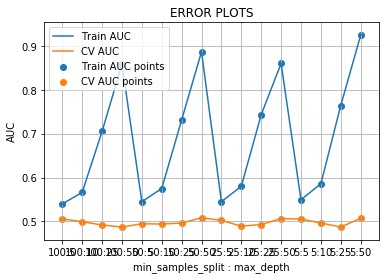

<Figure size 300000x90000 with 0 Axes>

In [52]:
from matplotlib.pyplot import figure

min_samples_split = [100,50,25,5]
depth = [5, 10,25,50]

train_auc = []
cv_auc = []
alpha = []

for i in min_samples_split:
    for j in depth :
        clf = tree.DecisionTreeClassifier(min_samples_split = i, max_depth = j,criterion='entropy')
        clf.fit(X_tr, y_train)

        preds_train = clf.predict_proba(X_tr)    
        preds_cv = clf.predict_proba(X_cr)

        y_train_pred = preds_train[:,1]
        y_cv_pred = preds_cv[:,1]
        
        alpha.append("{}:{}".format(i, j))
    
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
        
    
        
plt.plot(alpha, train_auc, label='Train AUC')
plt.plot(alpha, cv_auc, label='CV AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("min_samples_split : max_depth")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.figure(figsize=(1000,300), dpi = 300)
plt.show()
    

In [53]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree.png')
Image(graph.create_png())

In [54]:
print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in train data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[1])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.1499554367201426 Class 1:  0.8500445632798574
---------- Distribution of output variable in train data ----------
Class 0:  0.85 Class 1:  0.85


In [55]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

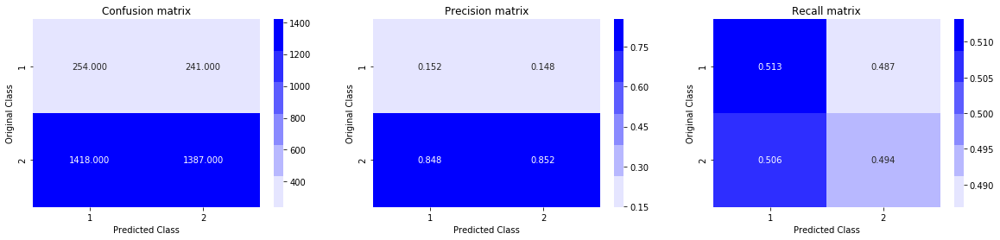

In [56]:
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

In [57]:
# please write all the code with proper documentation, and proper titles for each subsection
# go through documentations and blogs before you start coding
# first figure out what to do, and then think about how to do.
# reading and understanding error messages will be very much helpfull in debugging your code

# when you plot any graph make sure you use 
    # a. Title, that describes your plot, this will be very helpful to the reader
    # b. Legends if needed
    # c. X-axis label
    # d. Y-axis label

### 2.4.2 Applying Decision Tree on TFIDF,<font color='red'> SET 2</font>

In [58]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_title_tfidf, X_train_essay_tfidf, X_train_grade_ohe, X_train_teacher_ohe, X_train_state_ohe, subcategories_ohe_train, categories_ohe_train)).tocsr()
X_cr = hstack((X_cv_title_tfidf, X_cv_essay_tfidf, X_cv_grade_ohe, X_cv_teacher_ohe, X_cv_state_ohe, subcategories_ohe_cv, categories_ohe_cv)).tocsr()
X_te = hstack((X_test_title_tfidf, X_test_essay_tfidf, X_test_grade_ohe, X_test_teacher_ohe, X_test_state_ohe, subcategories_ohe_test, categories_ohe_test)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4488, 13972) (4488,)
(2211, 13972) (2211,)
(3300, 13972) (3300,)


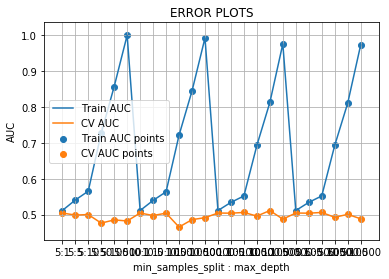

In [59]:
min_samples_split = [5, 10, 100, 500]
depth = [1, 5, 10, 50, 100, 500]

train_auc = []
cv_auc = []
alpha = []

for i in min_samples_split:
    for j in depth :
        clf1 = tree.DecisionTreeClassifier(min_samples_split = i, max_depth = j)
        clf1.fit(X_tr, y_train)

        preds_train = clf1.predict_proba(X_tr)    
        preds_cv = clf1.predict_proba(X_cr)

        y_train_pred = preds_train[:,1]
        y_cv_pred = preds_cv[:,1]
        
        alpha.append("{}:{}".format(i, j))
    
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
        
    
        
plt.plot(alpha, train_auc, label='Train AUC')
plt.plot(alpha, cv_auc, label='CV AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("min_samples_split : max_depth")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
#plt.figure(figsize=(100,30), dpi = 300)
plt.show()
    

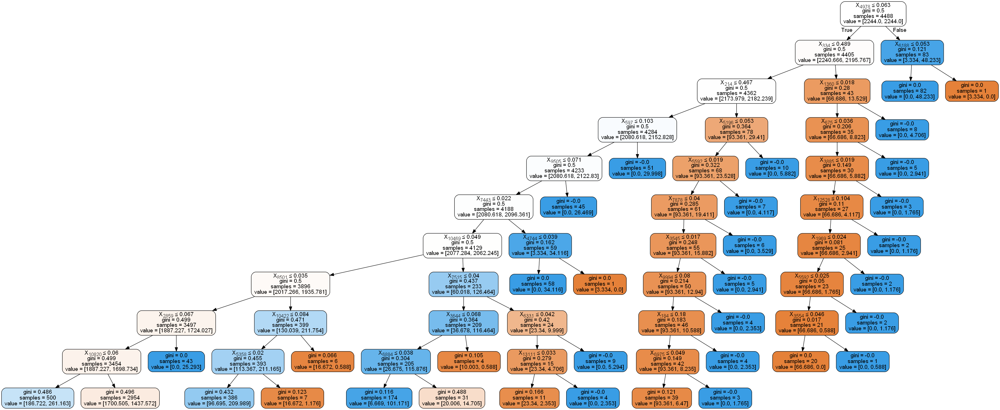

In [85]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree2.png')
Image(graph.create_png())

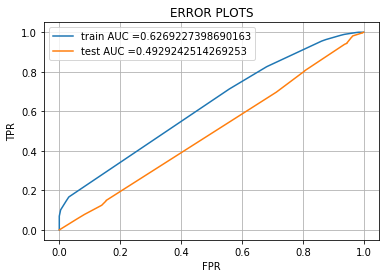

In [86]:
best_min_samples_split = 10
best_depth = 10

clf1 = tree.DecisionTreeClassifier(min_samples_split = best_min_samples_split, max_depth = best_depth, class_weight = 'balanced')
clf1.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs


pred_yy = clf1.predict_proba(X_tr)    
pred_y = clf1.predict_proba(X_te)

y_train_pred = pred_yy[:,1]
y_test_pred = pred_y[:,1]

train_fpr, train_tpr, tr_threshold = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_threshold = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()



In [87]:
print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in train data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[1])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.1499554367201426 Class 1:  0.8500445632798574
---------- Distribution of output variable in train data ----------
Class 0:  0.85 Class 1:  0.85


In [88]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

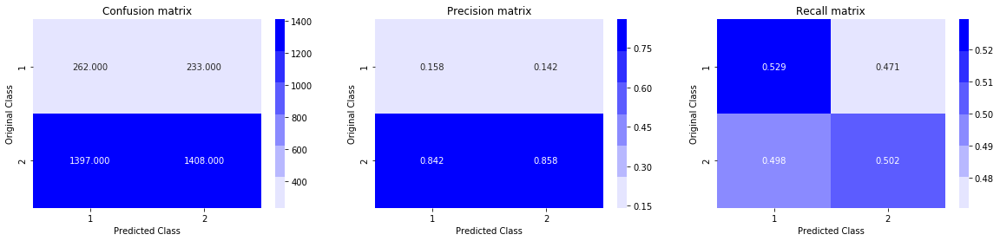

In [89]:
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

### 2.4.3 Applying Decision Tree on  AVG W2V,<font color='red'> SET 3</font>

In [90]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_title_avg_w2v, X_train_essay_avg_w2v, X_train_grade_ohe, X_train_teacher_ohe, X_train_state_ohe, subcategories_ohe_train, categories_ohe_train)).tocsr()
X_cr = hstack((X_cv_title_avg_w2v, X_cv_essay_avg_w2v, X_cv_grade_ohe, X_cv_teacher_ohe, X_cv_state_ohe, subcategories_ohe_cv, categories_ohe_cv)).tocsr()
X_te = hstack((X_test_title_avg_w2v, X_test_essay_avg_w2v, X_test_grade_ohe, X_test_teacher_ohe, X_test_state_ohe, subcategories_ohe_test, categories_ohe_test)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4488, 98) (4488,)
(2211, 98) (2211,)
(3300, 98) (3300,)


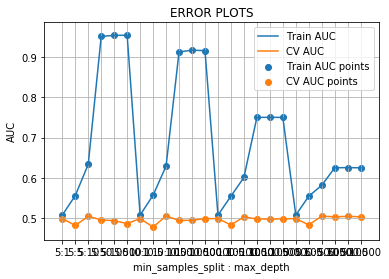

In [91]:
min_samples_split = [5, 10, 100, 500]
depth = [1, 5, 10, 50, 100, 500]

train_auc = []
cv_auc = []
alpha = []

for i in min_samples_split:
    for j in depth :
        clf = tree.DecisionTreeClassifier(min_samples_split = i, max_depth = j)
        clf.fit(X_tr, y_train)

        preds_train = clf.predict_proba(X_tr)    
        preds_cv = clf.predict_proba(X_cr)

        y_train_pred = preds_train[:,1]
        y_cv_pred = preds_cv[:,1]
        
        alpha.append("{}:{}".format(i, j))
    
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
        
    
        
plt.plot(alpha, train_auc, label='Train AUC')
plt.plot(alpha, cv_auc, label='CV AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("min_samples_split : max_depth")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
#plt.figure(figsize=(100,30), dpi = 300)
plt.show()
    

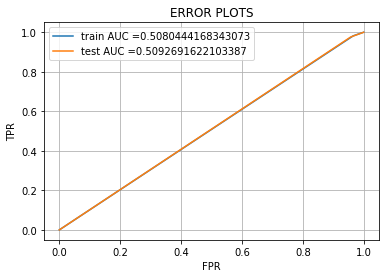

In [92]:
best_min_samples_split = 10
best_depth = 1

clf = tree.DecisionTreeClassifier(min_samples_split = best_min_samples_split, max_depth = best_depth, class_weight = 'balanced')
clf.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs


pred_yy = clf.predict_proba(X_tr)    
pred_y = clf.predict_proba(X_te)

y_train_pred = pred_yy[:,1]
y_test_pred = pred_y[:,1]

train_fpr, train_tpr, tr_threshold = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_threshold = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()



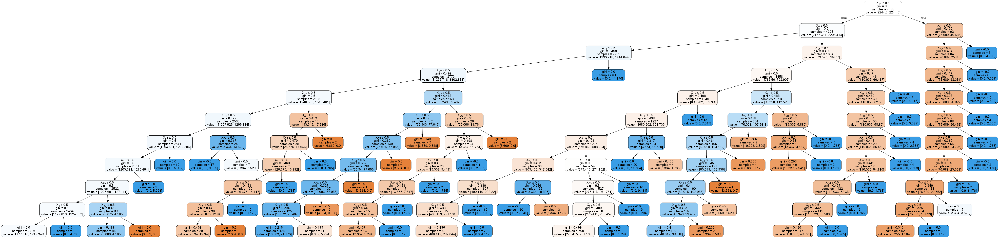

In [93]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree3.png')
Image(graph.create_png())

In [94]:
print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in train data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[1])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.1499554367201426 Class 1:  0.8500445632798574
---------- Distribution of output variable in train data ----------
Class 0:  0.85 Class 1:  0.85


In [95]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show() 

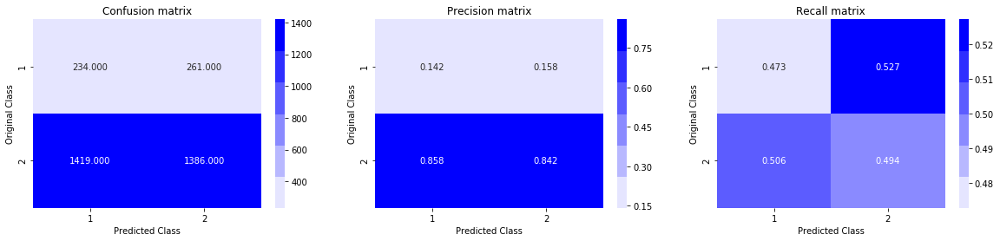

In [96]:
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y) 

### 2.4.4 Applying Decision Tree on TFIDF W2V,<font color='red'> SET 4</font>

In [97]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tr = hstack((X_train_title_tfidf_w2v, X_train_essay_tfidf_w2v, X_train_grade_ohe, X_train_teacher_ohe, X_train_state_ohe, subcategories_ohe_train, categories_ohe_train)).tocsr()
X_cr = hstack((X_cv_title_tfidf_w2v, X_cv_essay_tfidf_w2v, X_cv_grade_ohe, X_cv_teacher_ohe, X_cv_state_ohe, subcategories_ohe_cv, categories_ohe_cv)).tocsr()
X_te = hstack((X_test_title_tfidf_w2v, X_test_essay_tfidf_w2v, X_test_grade_ohe, X_test_teacher_ohe, X_test_state_ohe, subcategories_ohe_test, categories_ohe_test)).tocsr()

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(4488, 98) (4488,)
(2211, 98) (2211,)
(3300, 98) (3300,)


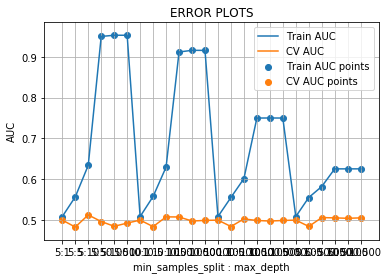

In [98]:
min_samples_split = [5, 10, 100, 500]
depth = [1, 5, 10, 50, 100, 500]

train_auc = []
cv_auc = []
alpha = []

for i in min_samples_split:
    for j in depth :
        clf = tree.DecisionTreeClassifier(min_samples_split = i, max_depth = j)
        clf.fit(X_tr, y_train)

        preds_train = clf.predict_proba(X_tr)    
        preds_cv = clf.predict_proba(X_cr)

        y_train_pred = preds_train[:,1]
        y_cv_pred = preds_cv[:,1]
        
        alpha.append("{}:{}".format(i, j))
    
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
        
    
        
plt.plot(alpha, train_auc, label='Train AUC')
plt.plot(alpha, cv_auc, label='CV AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("min_samples_split : max_depth")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
#plt.figure(figsize=(100,30), dpi = 300)
plt.show()
    

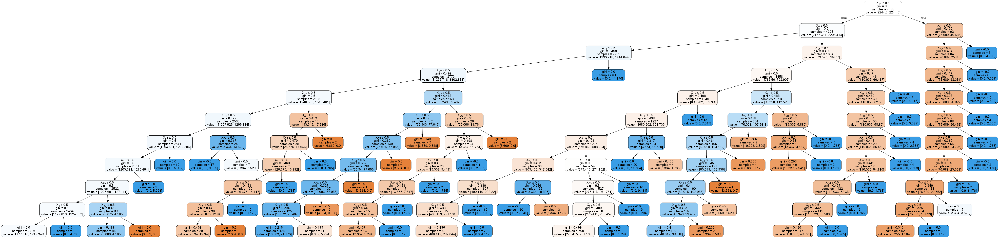

In [99]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf1, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree4.png')
Image(graph.create_png())

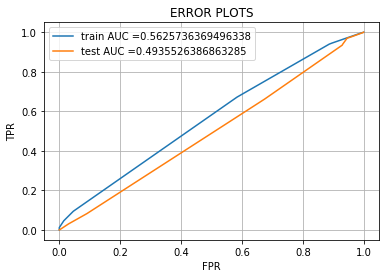

In [100]:
best_min_samples_split = 100
best_depth = 5

clf = tree.DecisionTreeClassifier(min_samples_split = best_min_samples_split, max_depth = best_depth, class_weight = 'balanced')
clf.fit(X_tr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs


pred_yy = clf.predict_proba(X_tr)    
pred_y = clf.predict_proba(X_te)

y_train_pred = pred_yy[:,1]
y_test_pred = pred_y[:,1]

train_fpr, train_tpr, tr_threshold = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_threshold = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()

plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()



In [101]:
print("-"*10, "Distribution of output variable in train data", "-"*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ",int(train_distr[0])/train_len,"Class 1: ", int(train_distr[1])/train_len)
print("-"*10, "Distribution of output variable in train data", "-"*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ",int(test_distr[1])/test_len, "Class 1: ",int(test_distr[1])/test_len)

---------- Distribution of output variable in train data ----------
Class 0:  0.1499554367201426 Class 1:  0.8500445632798574
---------- Distribution of output variable in train data ----------
Class 0:  0.85 Class 1:  0.85


In [102]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [1,2]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

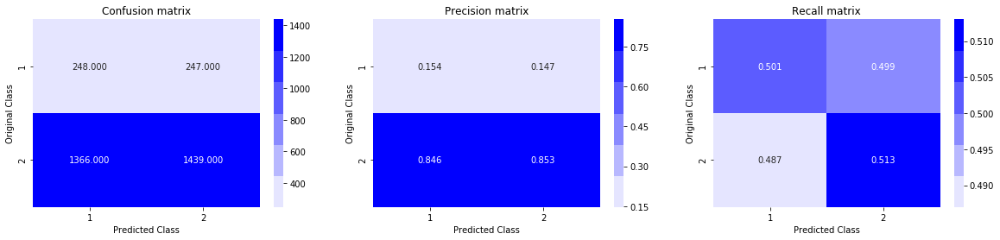

In [103]:
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

#  Select 5k best features from features of Set 2 using`feature_importances_`

In [71]:
def selectKImportance(clf1, y, k=200):
     return y[:,clf1.feature_importances_.argsort()[::-1][:k]]
    

In [72]:
newX_tr=selectKImportance(clf1,X_tr,200)
newX_te=selectKImportance(clf1,X_te,200)
newX_cr=selectKImportance(clf1,X_cr,200)
print(newX_tr.shape)
print(newX_te.shape)
print(newX_cr.shape)

(4488, 200)
(3300, 200)
(2211, 200)


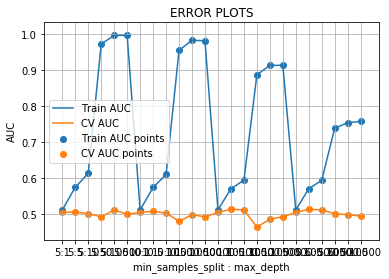

In [73]:
min_samples_split = [5, 10, 100, 500]
depth = [1, 5, 10, 50, 100, 500]

train_auc = []
cv_auc = []
alpha = []

for i in min_samples_split:
    for j in depth :
        clf2= tree.DecisionTreeClassifier(min_samples_split = i, max_depth = j)
        clf2.fit(newX_tr, y_train)

        preds_train = clf2.predict_proba(newX_tr)    
        preds_cv = clf2.predict_proba(newX_cr)

        y_train_pred = preds_train[:,1]
        y_cv_pred = preds_cv[:,1]
        
        alpha.append("{}:{}".format(i, j))
    
        train_auc.append(roc_auc_score(y_train,y_train_pred))
        cv_auc.append(roc_auc_score(y_cv, y_cv_pred))
        
    
        
plt.plot(alpha, train_auc, label='Train AUC')
plt.plot(alpha, cv_auc, label='CV AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')
plt.scatter(alpha, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("min_samples_split : max_depth")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
#plt.figure(figsize=(100,30), dpi = 300)
plt.show()
    

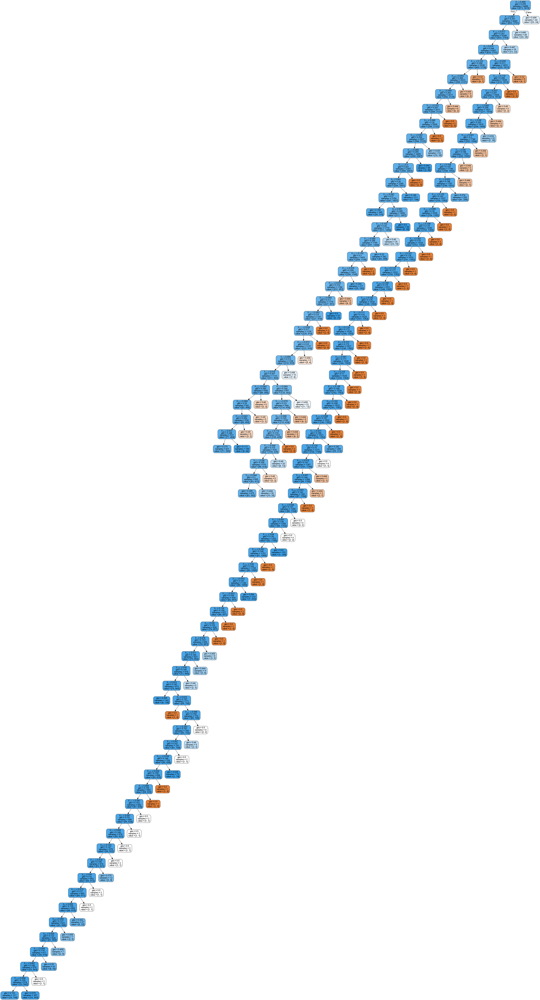

In [74]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data, filled=True, rounded=True, special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree5.png')
Image(graph.create_png())